This notebook demonstrates the straightforward computation of the "temporally-averaged reference image" (known in the RABASAR paper as the super image; this terminology sounds a little too Nietzschean for our taste).

### Notes

+ We do not compute a reference image using any change detection. This is called a "binary weighted" scheme in the [RABASAR paper](https://hal.archives-ouvertes.fr/hal-01791355/). This requires removing relative changes to a fixed image in the time series. Our application of change detection using the perscribed method was effective, but still produced artifacts when the averaging excluded only a few images within the time series. We also found that without change detection, the results were still reasonable.
+ We also have to do some spatial denoising as in the previous notebook on the temporally-averaged reference. We will recompute the ENL for the temporally-averaged image.

In [1]:
import rasterio
import numpy
import scipy
from rabasar import (admm_spatial_denoise, 
                     interpolate_nn, 
                     get_enl_img, 
                     get_enl_mode, 
                     get_enl_mask,
                     scale_img)
from itertools import starmap
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import json

# Read Config File

In [2]:
config_dict = json.load(open('config.json', 'r'))
config_dict

{'sensor': 'uavsar', 'site': 'waxlake', 'regularizer': 'tv'}

In [3]:
SENSOR = config_dict['sensor']
SITE = config_dict['site']
REGULARIZER = config_dict['regularizer']

# Data Paths

In [4]:
data_dir_path_name = f'{SENSOR}_{SITE}/data_reprojected'
if REGULARIZER != 'tv':
    data_dir_path_name += '_tv'
DATA_DIR = Path(data_dir_path_name)
DATA_DIR.exists()

True

In [5]:
TEMPORALLY_AVERAGED_IMAGE_DIR = Path(f'out/{SENSOR}_{SITE}_{REGULARIZER}/temporally_averaged_image')
TEMPORALLY_AVERAGED_IMAGE_DIR.mkdir(exist_ok=True, parents=True)

In [6]:
TEMPORALLY_AVERAGED_IMAGE_DIR_TV = Path(f'out/{SENSOR}_{SITE}_{REGULARIZER}/temporally_averaged_image_{REGULARIZER}')
TEMPORALLY_AVERAGED_IMAGE_DIR_TV.mkdir(exist_ok=True, parents=True)

In [7]:
hh_paths = sorted(list(DATA_DIR.glob('*/*hh*.tif')))
hv_paths = sorted(list(DATA_DIR.glob('*/*hv*.tif')))
vv_paths = sorted(list(DATA_DIR.glob('*/*vv*.tif')))

hv_paths

[PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190620.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190701.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190716.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190725.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190812.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190923.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190930.tif')]

In [8]:
hh_paths = sorted(list(DATA_DIR.glob('*/*hh*.tif')))
hv_paths = sorted(list(DATA_DIR.glob('*/*hv*.tif')))
vv_paths = sorted(list(DATA_DIR.glob('*/*vv*.tif')))

hv_paths

[PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190620.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190701.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190716.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190725.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190812.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190923.tif'),
 PosixPath('uavsar_waxlake/data_reprojected/hv/uavsar_waxlake_hv_RTC_20190930.tif')]

In [9]:
with rasterio.open(hv_paths[0]) as ds:
    profile = ds.profile

In [10]:
def read_arr(path):
    with rasterio.open(path) as ds:
        arr = ds.read(1)
    arr = np.clip(arr, 1e-4, .7)
    return arr
hv_ts = list(map(read_arr, hv_paths))
hh_ts = list(map(read_arr, hh_paths))
vv_ts = list(map(read_arr, vv_paths))

# Subset and Display

In [11]:
if SITE == 'waxlake' and SENSOR == 'uavsar' and REGULARIZER == 'tv':
    sy = np.s_[-2000:-1000]
    sx = np.s_[-3000:-2000]
else:
    raise NotImplementedError

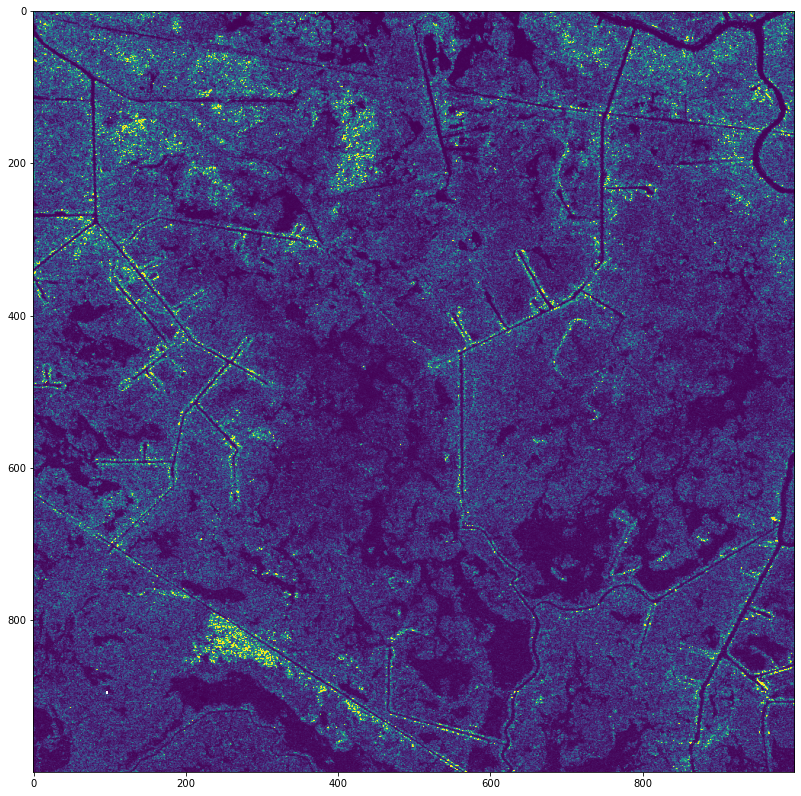

In [12]:
plt.figure(figsize=(14, 14))
plt.imshow(hv_ts[0][sy, sx], vmin=0, vmax=.1)

# The Temporal Average

Stack the images and take their average.

In [13]:
def temporal_average(pol):
    if pol == 'hh':
        ts = hh_ts
    elif pol == 'vv':
        ts = vv_ts
    else:
        ts = hv_ts
    n = len(ts)
    stack = np.stack(ts, axis=2)
    temporally_averaged_image = np.nanmean(stack, axis=2)
    return temporally_averaged_image
            
    
    

In [14]:
ta_image = temporal_average('hv')

/Users/cmarshak/anaconda3/envs/rabasar_env/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.


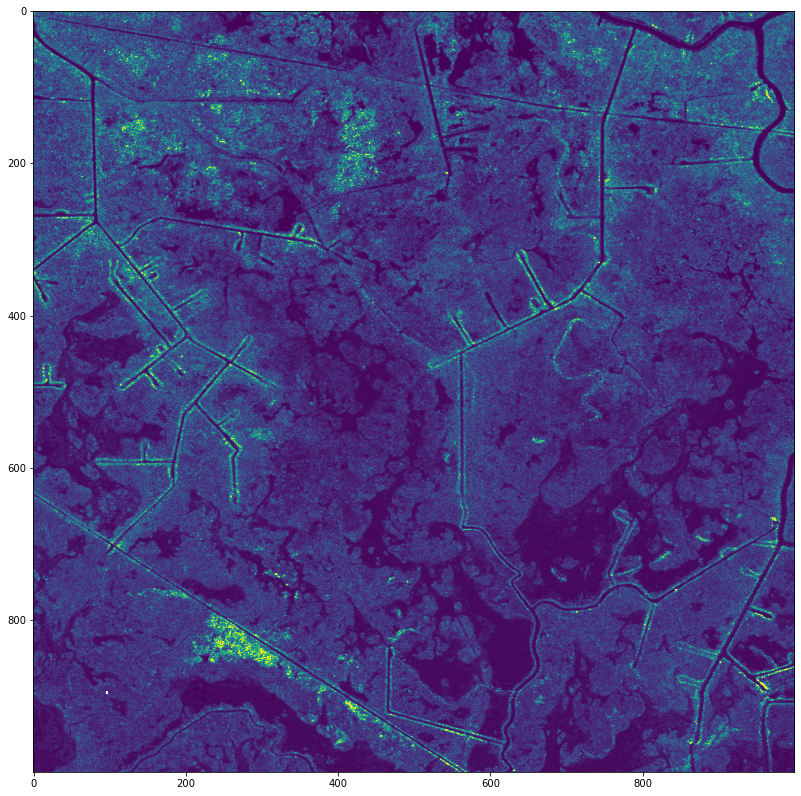

In [15]:
plt.figure(figsize=(14, 14))
plt.imshow(ta_image[sy, sx], vmin=0, vmax=.1)

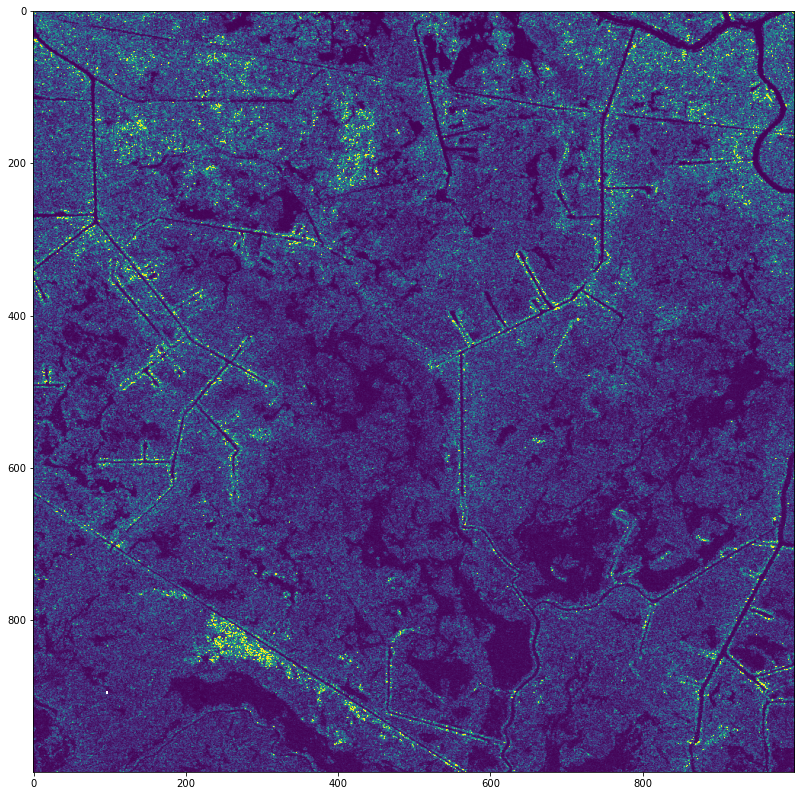

In [16]:
plt.figure(figsize=(14, 14))
plt.imshow(hv_ts[1][sy, sx], vmin=0, vmax=.1)

## Compute the temporal averages for each polarization

In [17]:
ta_hh = temporal_average('hh')
ta_hv = temporal_average('hv')
ta_vv = temporal_average('vv')

/Users/cmarshak/anaconda3/envs/rabasar_env/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.


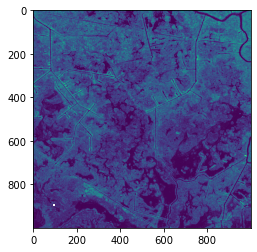

In [18]:
plt.imshow(ta_hh[sy, sx])

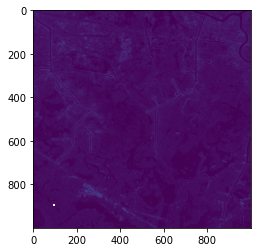

In [19]:
plt.imshow(ta_hv[sy, sx])

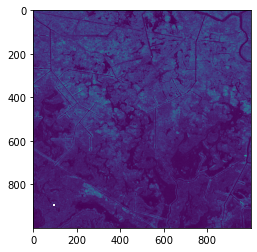

In [20]:
plt.imshow(ta_vv[sy, sx])

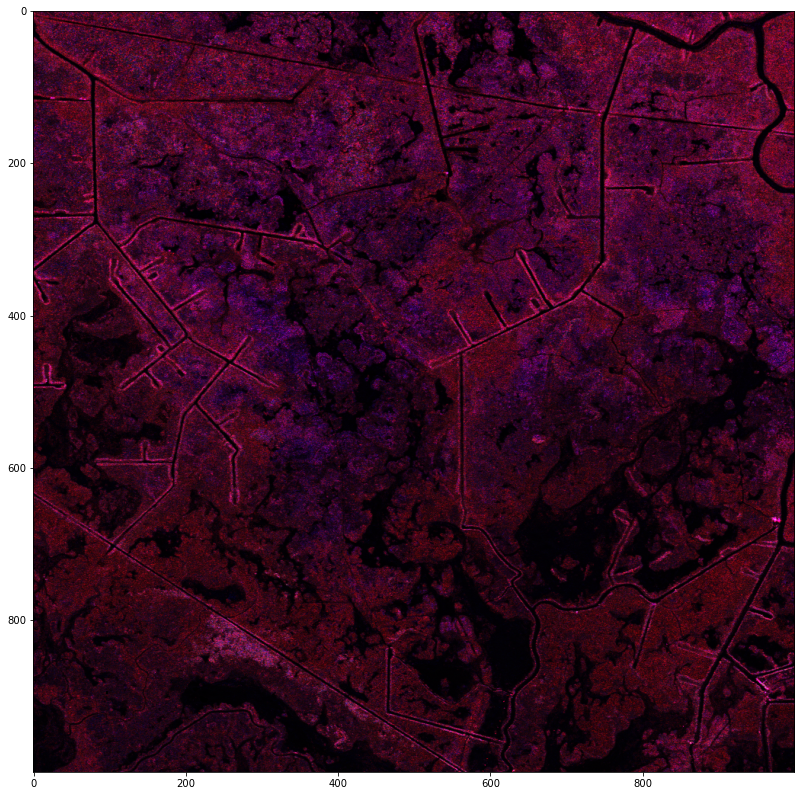

In [21]:
plt.figure(figsize=(14, 14))
X = np.stack([(ta_hh[sy, sx]),
              (ta_hv[sy, sx]),
              (ta_vv[sy, sx])
             ], axis=2)
plt.imshow(scale_img(X))

In [22]:
for si, pol in zip(tqdm([ta_hh, ta_hv, ta_vv]), ['hh', 'hv', 'vv']):
    dest_path = TEMPORALLY_AVERAGED_IMAGE_DIR/f'{SITE}_{SENSOR}_temporally_averaged_{pol}.tif'
    with rasterio.open(dest_path, 'w', **profile) as ds:
        ds.write(si, 1)

100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


# Despeckling the Temporally Averaged Reference

In [23]:
X = ta_hh[sy, sx]
enl_mask = get_enl_mask(X, db_min=-13)
enl_img = get_enl_img(X, 31, enl_max=20, mask=enl_mask)
L = round(get_enl_mode(enl_img))
L

5

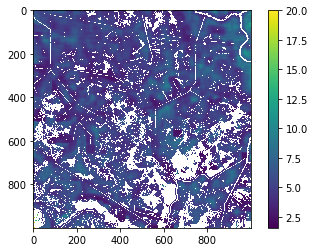

In [24]:
plt.imshow(enl_img, interpolation='none')
plt.colorbar()

In [25]:
if REGULARIZER == 'tv':
    regularizer_dict = {
                         'weight': 1
                        }
    
elif REGULARIZER == 'bm3d':
    regularizer_dict = {
                         'weight': .1
                        }
else:
    pass

In [33]:
X = (ta_hh[sy, sx])
X_filled = interpolate_nn(X)
X_den, res_list = admm_spatial_denoise(X_filled,
                                       L,
                                       REGULARIZER,
                                       regularizer_dict, 
                                       max_admm_iterations=10,
                                       newton_iterations=3
                                       )
X_den[np.isnan(X)] = np.nan

admm_iterations: 100%|██████████| 10/10 [00:02<00:00,  4.43it/s]


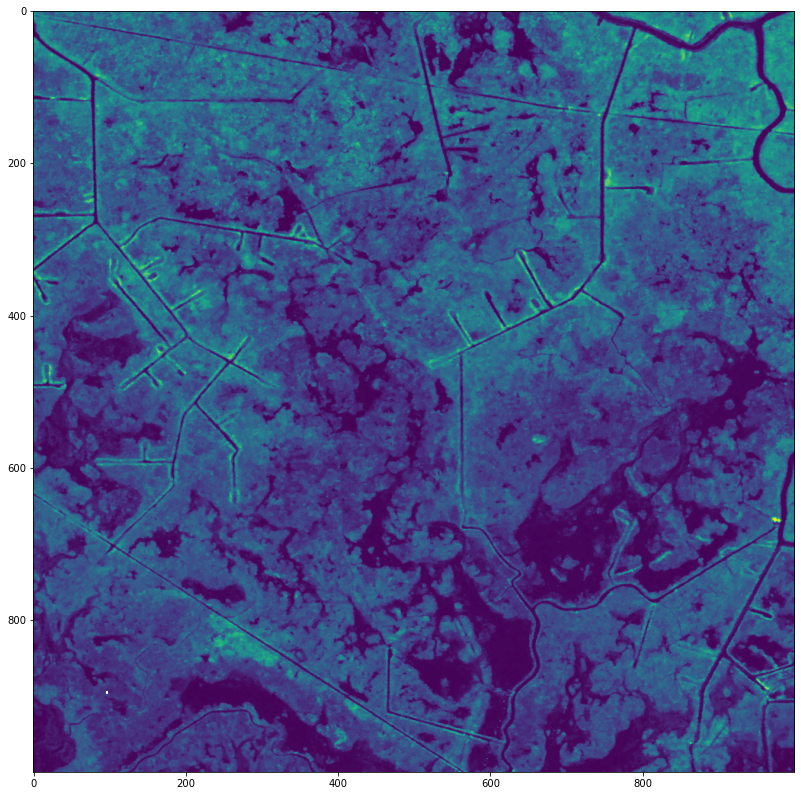

In [27]:
plt.figure(figsize=(14, 14))
plt.imshow(X_den)

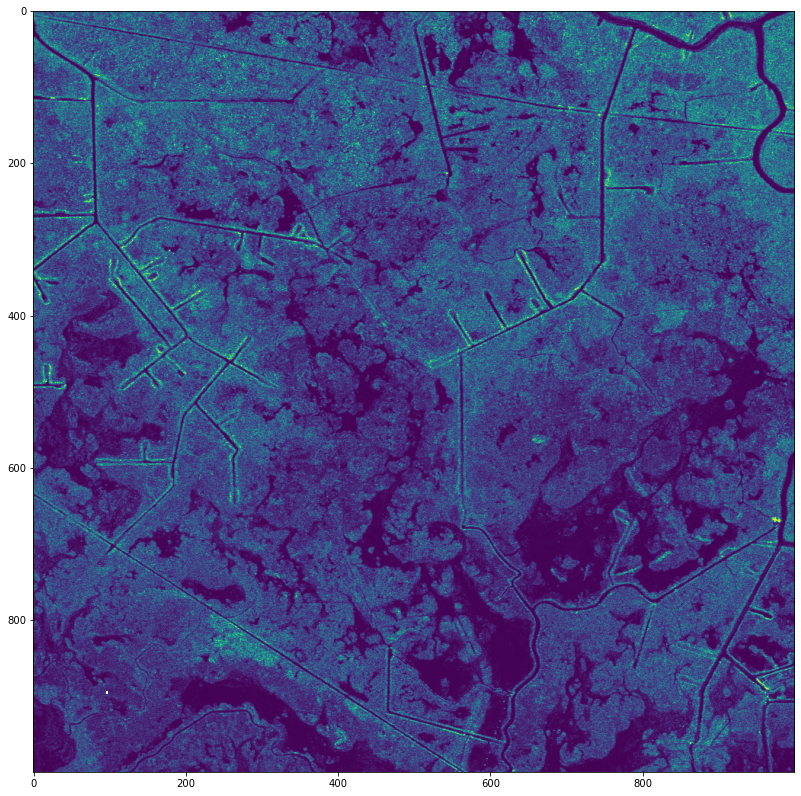

In [28]:
plt.figure(figsize=(14, 14))
plt.imshow(X)

# Despeckle all Temporally Average References

We use the weight from above.

In [29]:
mask = np.isnan(ta_hh)

In [30]:
def denoise_and_write_one_superimage(img, pol, weight):

    regularizer_dict = {
                         'weight': weight
                        }
    
    img_den, res_list = admm_spatial_denoise(img,
                                              L,
                                              REGULARIZER,
                                              regularizer_dict, 
                                              max_admm_iterations=10,
                                              newton_iterations=3
                                              )
    img_den[mask] = np.nan
    
    dest_dir = Path(f'{str(TEMPORALLY_AVERAGED_IMAGE_DIR_TV)}')/f'weight_{weight:1.2f}'
    dest_dir.mkdir(exist_ok=True, parents=True)
    
    dest_path = dest_dir/f'{SITE}_{SENSOR}_temporally_average_{pol}_{REGULARIZER}_{weight:1.2f}.tif'
    with rasterio.open(dest_path, 'w', **profile) as ds:
        ds.write(img_den, 1)
    return dest_path

In [31]:
ta_vv_nn = interpolate_nn(ta_vv)
ta_hv_nn = interpolate_nn(ta_hv)
ta_hh_nn = interpolate_nn(ta_hh)

In [32]:
list(starmap(denoise_and_write_one_superimage,zip([ta_hh_nn, ta_hv_nn, ta_vv_nn], 
                                                  # Polarization
                                                  tqdm(['hh', 'hv', 'vv']), 
                                                  # Weight
                                                  [1] * 3
                                                  )))


 67%|██████▋   | 2/3 [04:06<02:03, 123.42s/it]


[PosixPath('out/uavsar_waxlake_tv/temporally_averaged_image_tv/weight_1.00/waxlake_uavsar_temporally_average_hh_tv_1.00.tif'),
 PosixPath('out/uavsar_waxlake_tv/temporally_averaged_image_tv/weight_1.00/waxlake_uavsar_temporally_average_hv_tv_1.00.tif'),
 PosixPath('out/uavsar_waxlake_tv/temporally_averaged_image_tv/weight_1.00/waxlake_uavsar_temporally_average_vv_tv_1.00.tif')]